In [2]:
from google.colab import drive
drive.mount('/content/drive')

# make path = './' in-case you are running this locally
path = '/content/drive/My Drive/ECSE416_ComputerVision/A2/'
print(path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/ECSE416_ComputerVision/A2/


In [3]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

# 1. Invariance of SIFT Features
## 1.1. Invariance Under Changes in Scale
1.1.1 Compute SIFT keypoints for the reference image.


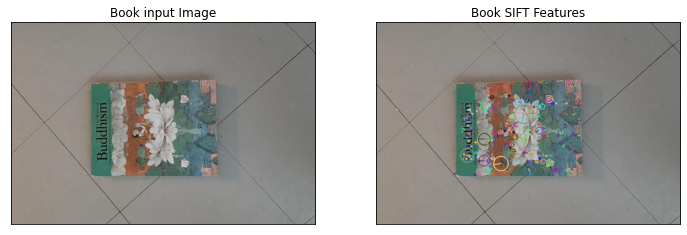

Num keypoints: 385


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# load the image
book = cv2.imread(path+"images/book.jpg")

# copy the image
book_disp = book.copy()

# convert from BGR to RGB
book = cv2.cvtColor(book, cv2.COLOR_BGR2RGB)
book_disp = cv2.cvtColor(book_disp, cv2.COLOR_BGR2RGB)

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
# detect (image, mask), mask is used when you want to detect features from a specific part of image
keypoints = sift.detect(book, None)

# draw the keypoints
cv2.drawKeypoints(book, keypoints, book_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(12,12))
plt.subplot(121), plt.imshow(book)
plt.title("Book input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(book_disp)
plt.title("Book SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

# printing number of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

1.1.2. Scale reference image using scaling factors of (0.2, 0.5, 0.8, 1.25, 2, 5).

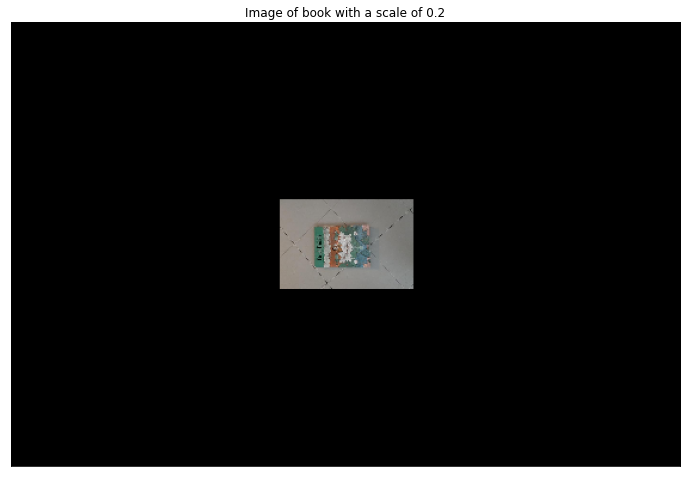

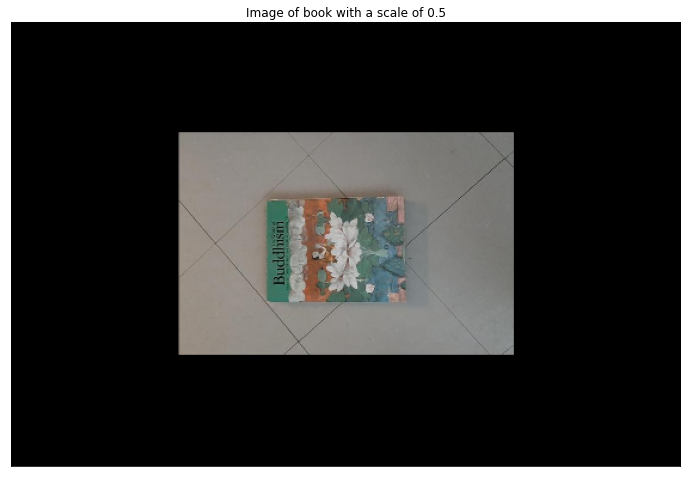

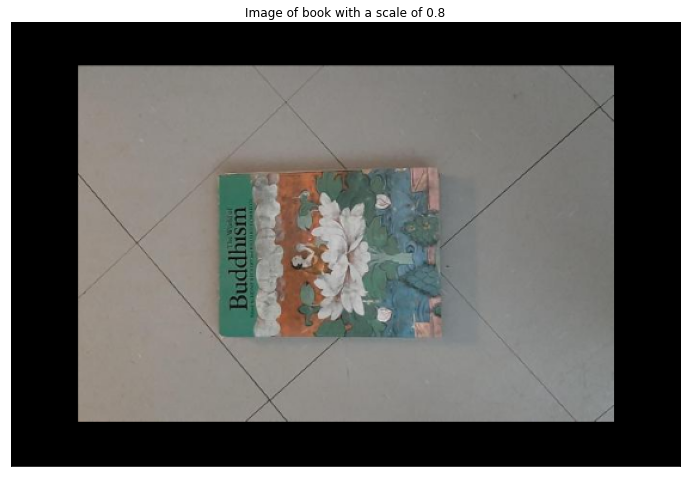

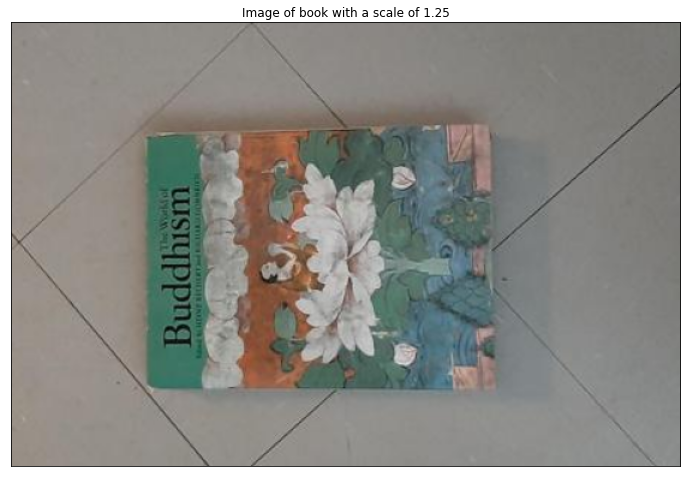

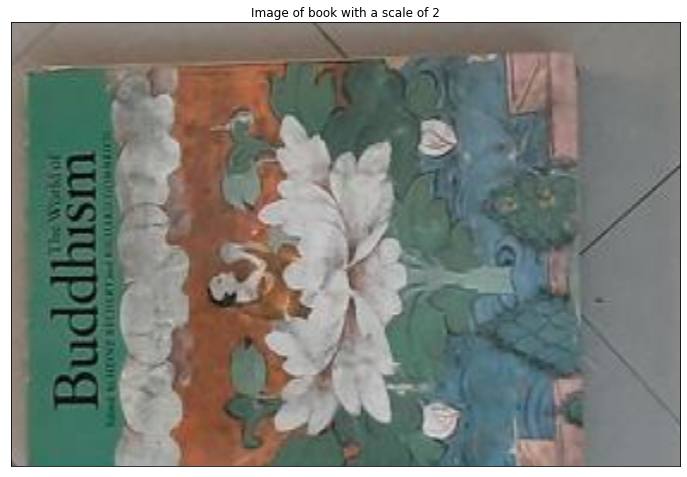

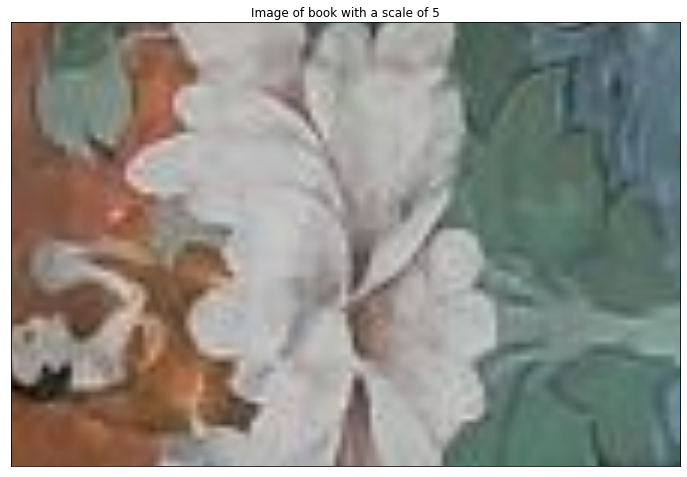

In [5]:
# load the image
book_img = cv2.imread(path+"images/book.jpg")
book_img = cv2.cvtColor(book_img, cv2.COLOR_BGR2RGB)

# image size
height, width = book_img.shape[0:2]
Scalesizes = [0.2, 0.5, 0.8, 1.25, 2, 5]

# define the array sclaed books 
bookscaled = []

# Create a rotated, scaled duplicate
# rotation marix around the center pixel, 0 degrees,scales of (0.2, 0.5, 0.8, 1.25, 2, 5)
# Apply the transformation matrix
for s in range(len(Scalesizes)):
  M = cv2.getRotationMatrix2D((width/2,height/2),0, Scalesizes[s])
  book = cv2.warpAffine(book_img,M,(width,height))
  bookscaled.append(book)

#plot the images
for w in range(6):
  plt.figure(figsize=(12,12))
  plt.imshow(bookscaled[w])
  plt.title("Image of book with a scale of " +str(Scalesizes[w])), plt.xticks([]), plt.yticks([])
  plt.show()


1.1.3. Compute SIFT keypoints for the transformed images.

In [6]:
#defining the array keypoints
keypointsscaled = []

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
# detect (image, mask), mask is used when you want to detect features from a specific part of image
# draw the keypoints
for x in range(len(bookscaled)):
  keypoints,descriptors = sift.detectAndCompute(bookscaled[x],None)
  keypointsnum = len(keypoints)
  print("number of keypoints of the transformed images for scale of " + str (Scalesizes[x]) +": " + str(keypointsnum))
  keypointsscaled.append(keypoints)

number of keypoints of the transformed images for scale of 0.2: 42
number of keypoints of the transformed images for scale of 0.5: 130
number of keypoints of the transformed images for scale of 0.8: 305
number of keypoints of the transformed images for scale of 1.25: 675
number of keypoints of the transformed images for scale of 2: 1060
number of keypoints of the transformed images for scale of 5: 271


 1.1.4. Match all keypoints of the reference image to the transformed images using a brute-force method.
 
1.1.5. Sort matching keypoints according to the matching distance. 
 
 1.1.6. Display top ten matched keypoints for each pair of reference image and a
transformed image.

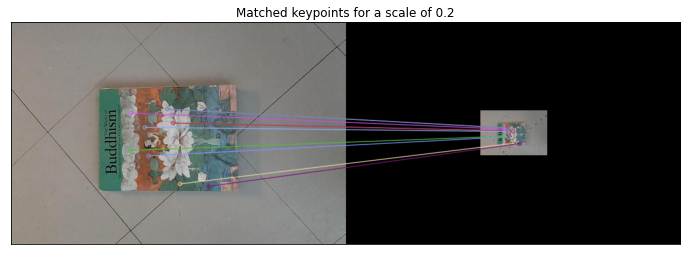

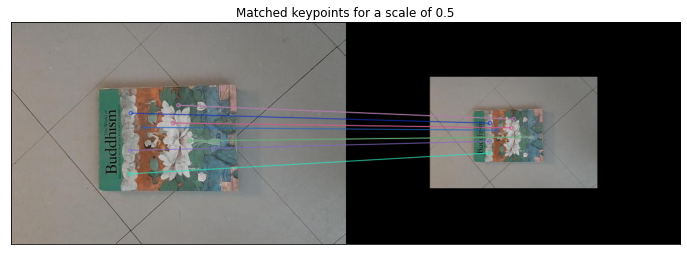

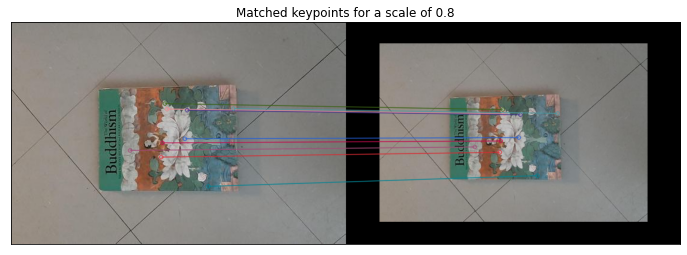

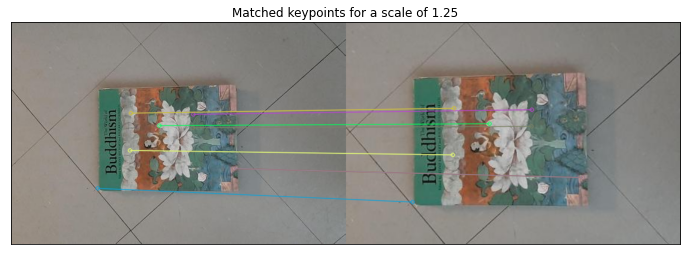

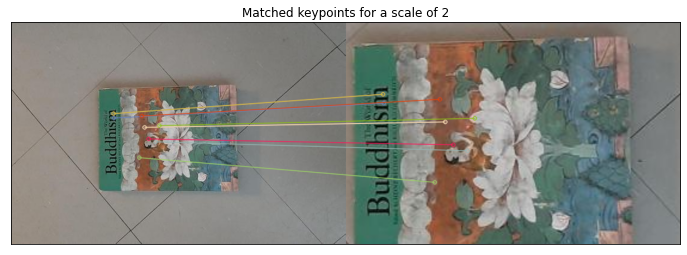

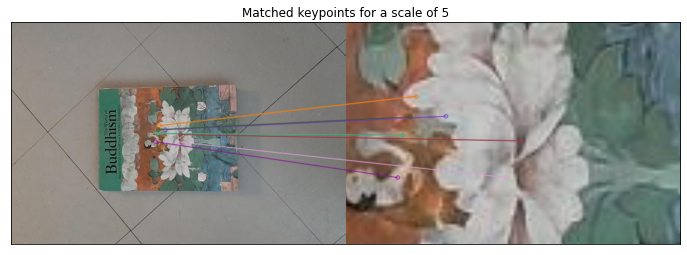

In [7]:
#defining the arrays for descriptors and matches
descriptorsscaled = []
matchesscaled = []

# Compute the keypoints/descriptors of original image.
keypoints_og,descriptors_og = sift.detectAndCompute(book_img,None)

# Compute the keypoints/descriptors of sclaed image
for t in range(len(bookscaled)):
  keypoints,descriptors = sift.detectAndCompute(bookscaled[t],None)
  descriptorsscaled.append(descriptors)

# create BFMatcher object
bf = cv2.BFMatcher()#cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
for u in range(len(descriptorsscaled)):
  matches = bf.match(descriptors_og,descriptorsscaled[u]) 
  matchesscaled.append(matches)

# Sort them in the order of their distance.
for v in range(len(matchesscaled)):
  matchesscaled[v] = sorted(matchesscaled[v], key = lambda x:x.distance)

# Draw first 10 matches and plot the images
for w in range(6):
  book = cv2.drawMatches(book_img,keypoints_og,bookscaled[w],keypointsscaled[w], matchesscaled[w][:10], None, flags=2)
  plt.figure(figsize=(12,12))
  plt.imshow(book)
  plt.title("Matched keypoints for a scale of " +str(Scalesizes[w])), plt.xticks([]), plt.yticks([])
  plt.show()

1.1.7. Plot the matching distance for top 100 matched keypoints. Plot indices of keypoints on x-axis and corresponding matching distance on y-axis.

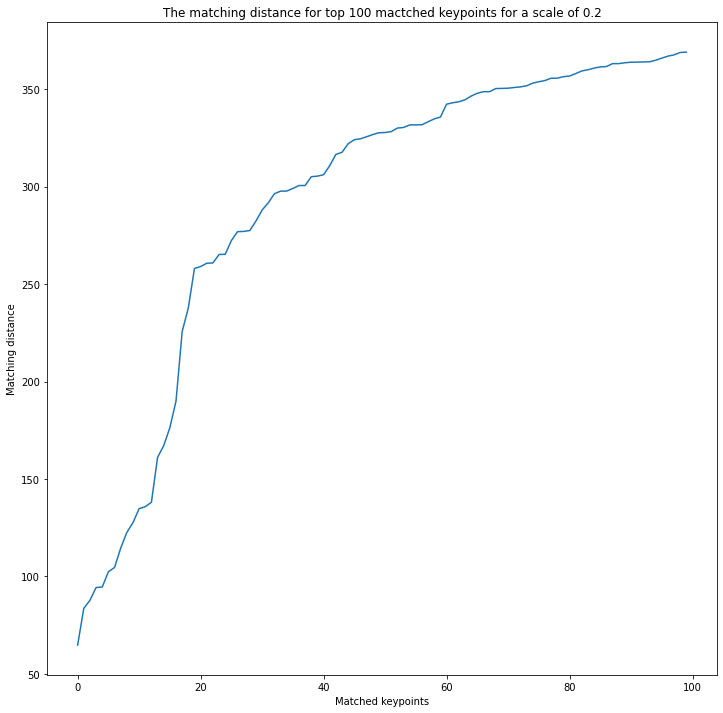

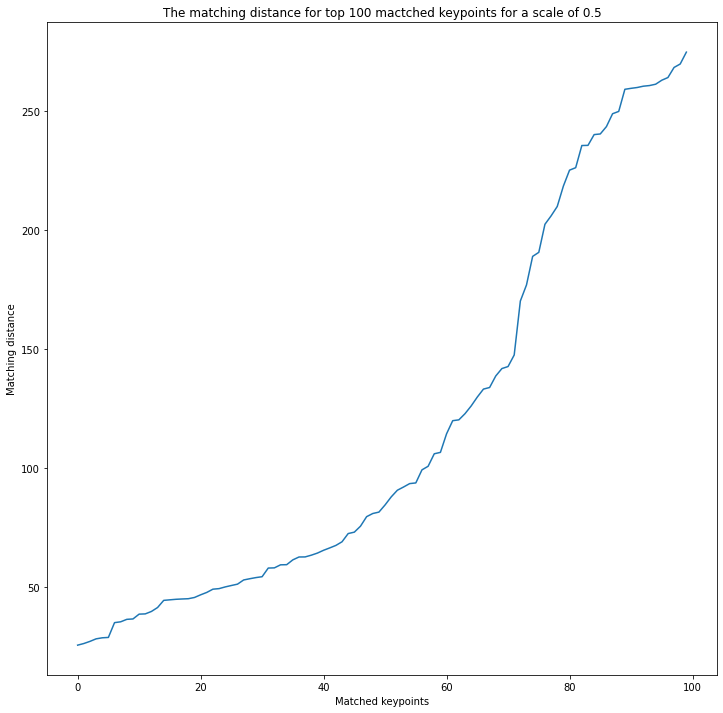

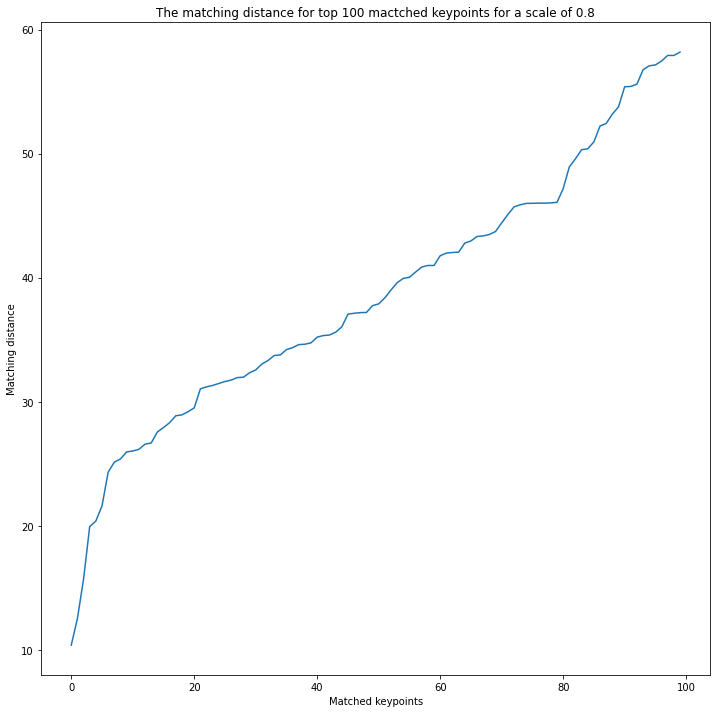

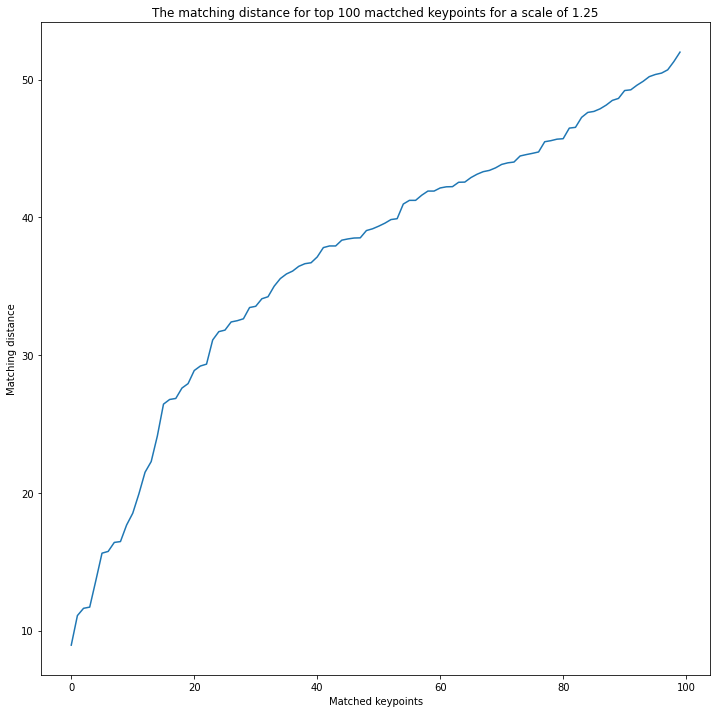

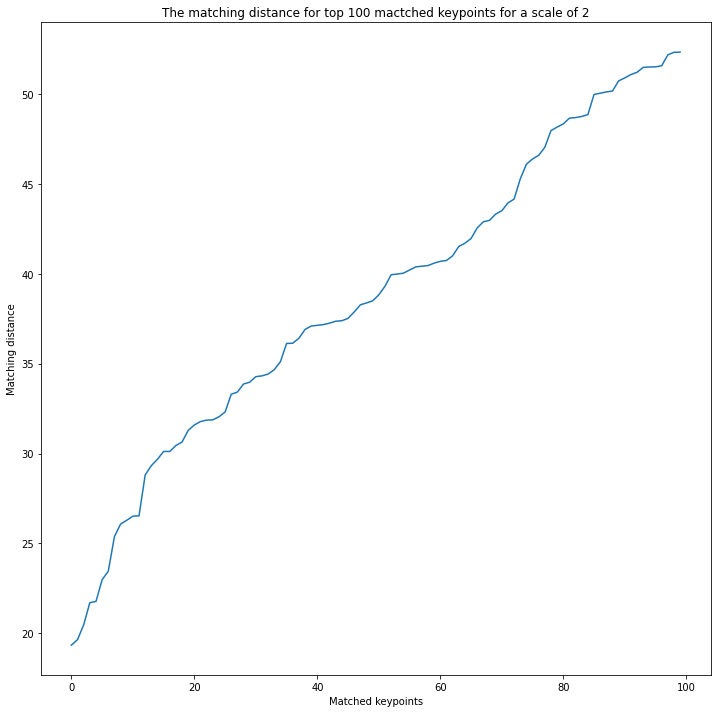

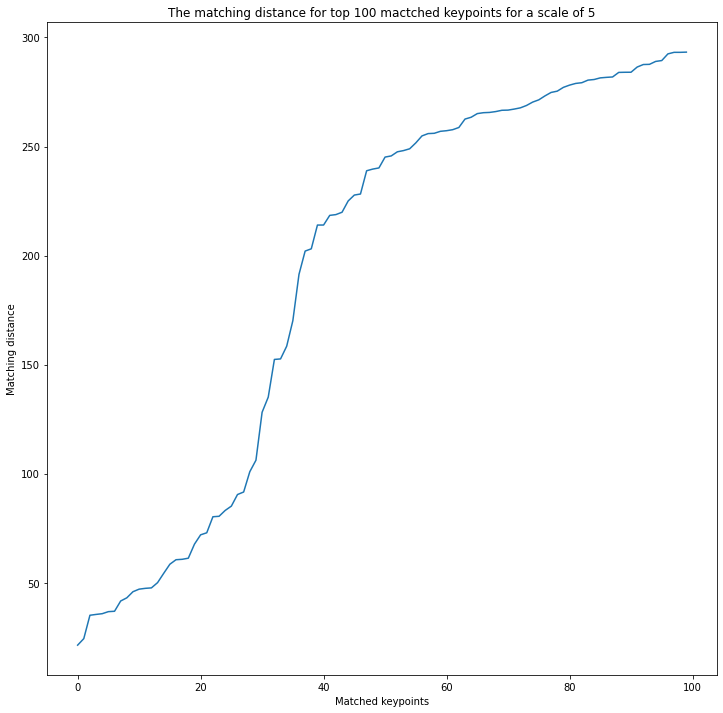

In [8]:
# Set the range of the keypoints on the  x axis to be 100 
keypoints_range = np.arange(100)

#Define array for matching distance on the y axis
# matching the distances to the top keypoints and plotting for each scaled image
for x in range(6):
  matching_distance = []
  for n, m in enumerate(matchesscaled[x]):
      matching_distance.append(m.distance)
  plt.figure(figsize=(12,12))
  plt.plot(keypoints_range, matching_distance[:100])
  plt.title("The matching distance for top 100 mactched keypoints for a scale of "+str(Scalesizes[x]))
  plt.xlabel("Matched keypoints")
  plt.ylabel("Matching distance")
plt.show()

1.1.8. Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Reason the cause.

*From the trend in the plotted results we can see that the increase in scales from 0.2 to 2 leads to a lower matching distance. However at a scaling factor of 5 the distance increases again. As the scale of the images increase the image typically becomes more "clear" but at a certain point the image is too zoomed and becomes "blurry" again making the matching distance increase.*

## Invariance Under Rotation
1.2.1. Compute SIFT keypoints for the reference image

In [9]:
# load the image
book = cv2.imread(path+"images/book.jpg")

# copy the image
book_disp = book.copy()

# convert from BGR to RGB
book = cv2.cvtColor(book, cv2.COLOR_BGR2RGB)
book_disp = cv2.cvtColor(book_disp, cv2.COLOR_BGR2RGB)

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
# detect (image, mask), mask is used when you want to detect features from a specific part of image
keypoints = sift.detect(book, None)

# draw the keypoints
cv2.drawKeypoints(book, keypoints, book_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# printing number of SIFT keypoints
print('Number of keypoints: '+ str(len(keypoints)))

Number of keypoints: 385


1.2.2. Rotate reference image at the angle of (10, 30, 90, 150, 170, 180).

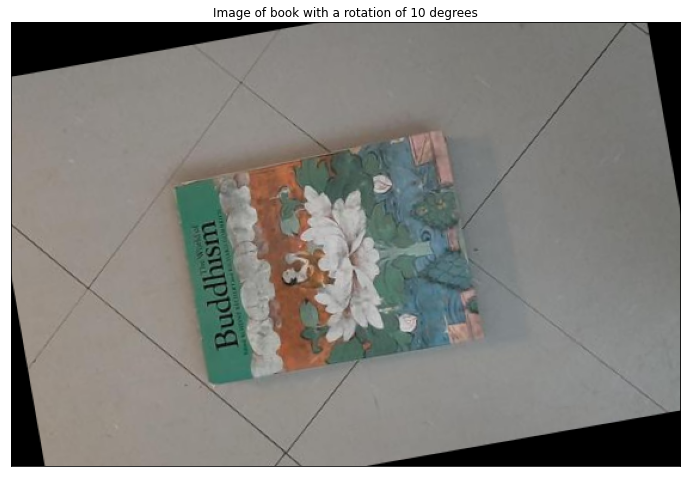

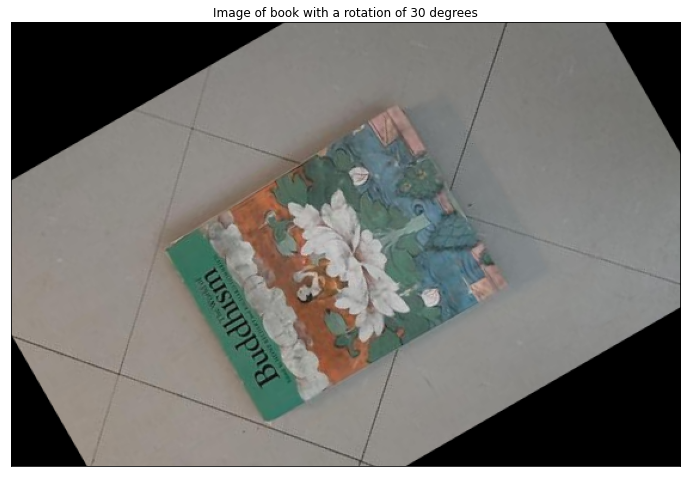

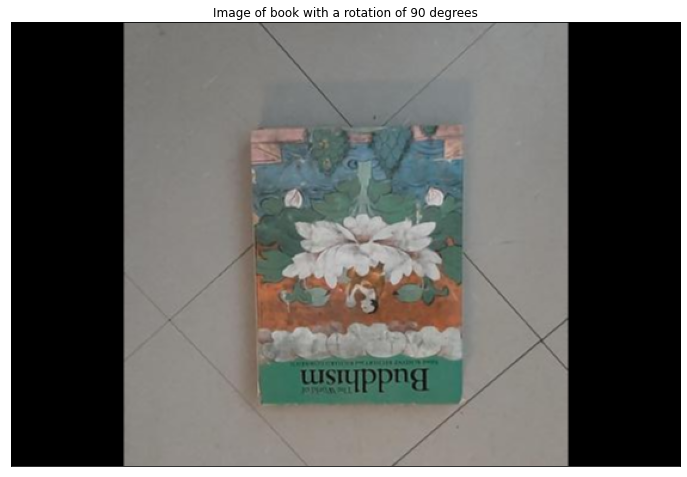

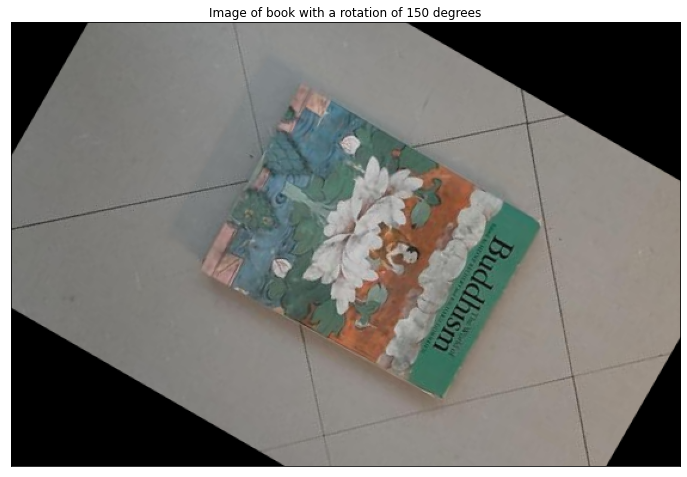

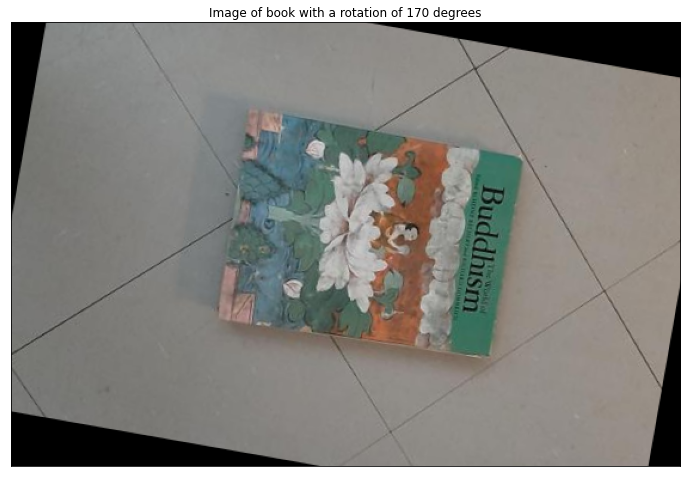

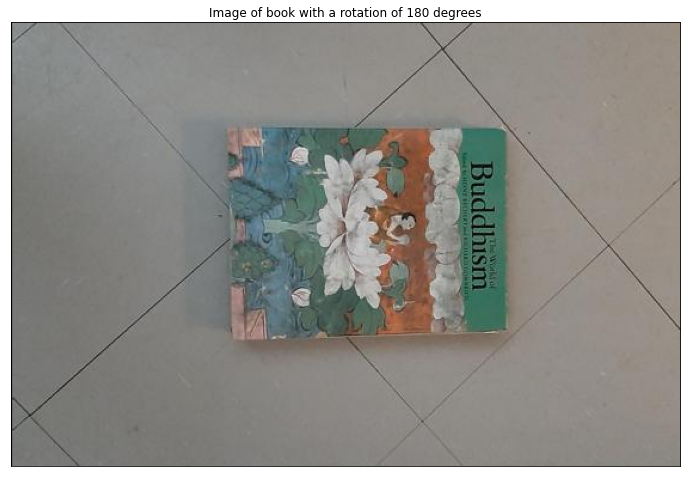

In [10]:
# image size
Rotateangles = [10, 30, 90, 150, 170, 180]

# define the array rotated books 
bookrotated = []

# Create a rotated, scaled duplicate
# rotation marix around the center pixel, (10, 30, 90, 150, 170, 180) degrees,scales of 1
# Apply the transformation matrix
for s in range(len(Rotateangles)):
  M = cv2.getRotationMatrix2D((width/2,height/2),Rotateangles[s],1)
  book = cv2.warpAffine(book_img,M,(width,height))
  bookrotated.append(book)

#plot the images
for w in range(6):
  plt.figure(figsize=(12,12))
  plt.imshow(bookrotated[w])
  plt.title("Image of book with a rotation of " +str(Rotateangles[w]) + " degrees"), plt.xticks([]), plt.yticks([])
  plt.show()

1.2.3. Compute SIFT keypoints for the transformed images.

In [11]:
#defining the array keypoints
keypointsrotated = []

# detect SIFT features, with no masks
# detect (image, mask), mask is used when you want to detect features from a specific part of image
# draw the keypoints
for x in range(len(bookrotated)):
  keypoints,descriptors = sift.detectAndCompute(bookrotated[x],None)
  keypointsnum = len(keypoints)
  print("Number of keypoints of the transformed images for rotation of " + str (Rotateangles[x]) +" degrees: " + str(keypointsnum))
  keypointsrotated.append(keypoints)

Number of keypoints of the transformed images for rotation of 10 degrees: 439
Number of keypoints of the transformed images for rotation of 30 degrees: 446
Number of keypoints of the transformed images for rotation of 90 degrees: 477
Number of keypoints of the transformed images for rotation of 150 degrees: 446
Number of keypoints of the transformed images for rotation of 170 degrees: 456
Number of keypoints of the transformed images for rotation of 180 degrees: 400


1.2.4. Match all keypoints of the reference image to the transformed images using a brute-force method.

1.2.5. Sort matching keypoints according to the matching distance.

1.2.6. Display top ten matched keypoints for each pair of reference image and a
transformed image.

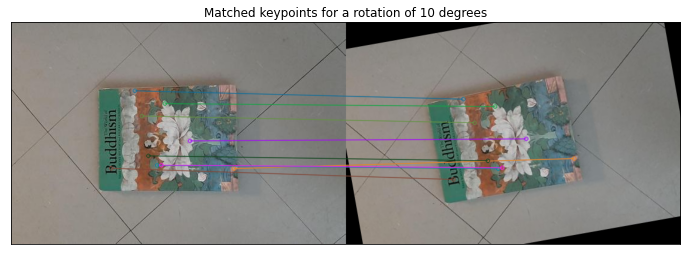

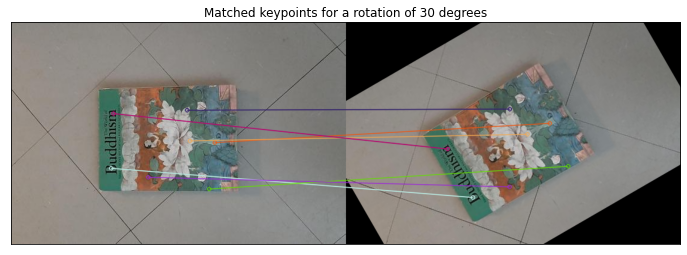

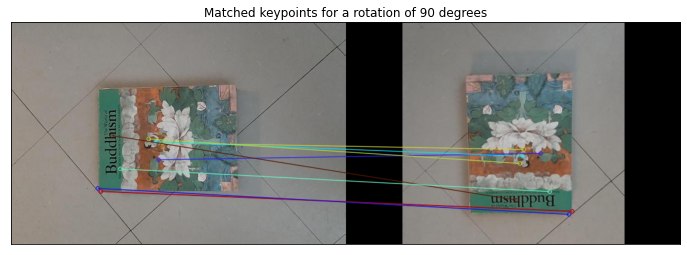

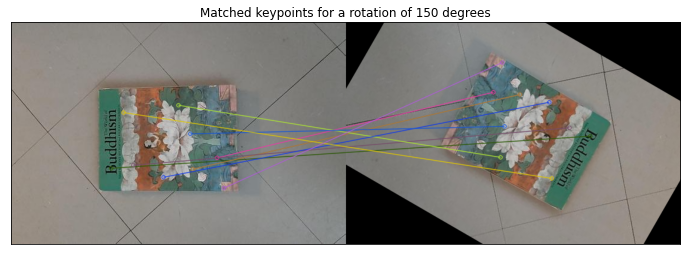

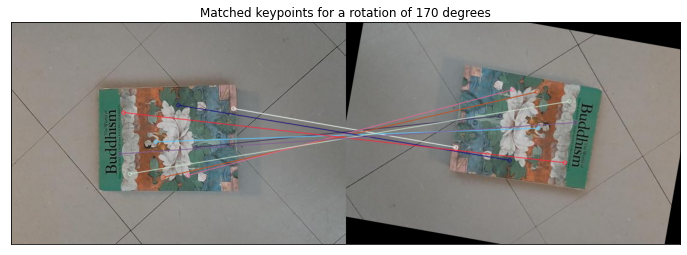

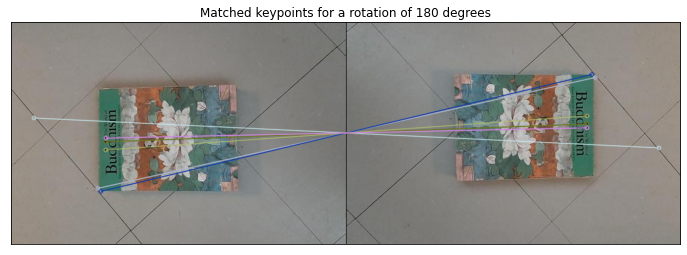

In [12]:
#defining the arrays for descriptors and matches
descriptorrrotated = []
matchesrotated = []

# Compute the keypoints/descriptors of rotated images
for t in range(len(bookrotated)):
  keypoints,descriptors = sift.detectAndCompute(bookrotated[t],None)
  descriptorrrotated.append(descriptors)

# create BFMatcher object
bf = cv2.BFMatcher()#cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
for u in range(len(descriptorrrotated)):
  matches = bf.match(descriptors_og,descriptorrrotated[u]) 
  matchesrotated.append(matches)

# Sort them in the order of their distance.
for v in range(len(matchesrotated)):
  matchesrotated[v] = sorted(matchesrotated[v], key = lambda x:x.distance)

# Draw first 10 matches and plot the images
for w in range(6):
  book = cv2.drawMatches(book_img,keypoints_og,bookrotated[w],keypointsrotated[w], matchesrotated[w][:10], None, flags=2)
  plt.figure(figsize=(12,12))
  plt.imshow(book)
  plt.title("Matched keypoints for a rotation of " +str(Rotateangles[w]) + " degrees"), plt.xticks([]), plt.yticks([])
  plt.show()

1.2.7. Plot the matching distance for top 100 matched keypoints. Plot indices of keypoints on x-axis and corresponding matching distance on y-axis.

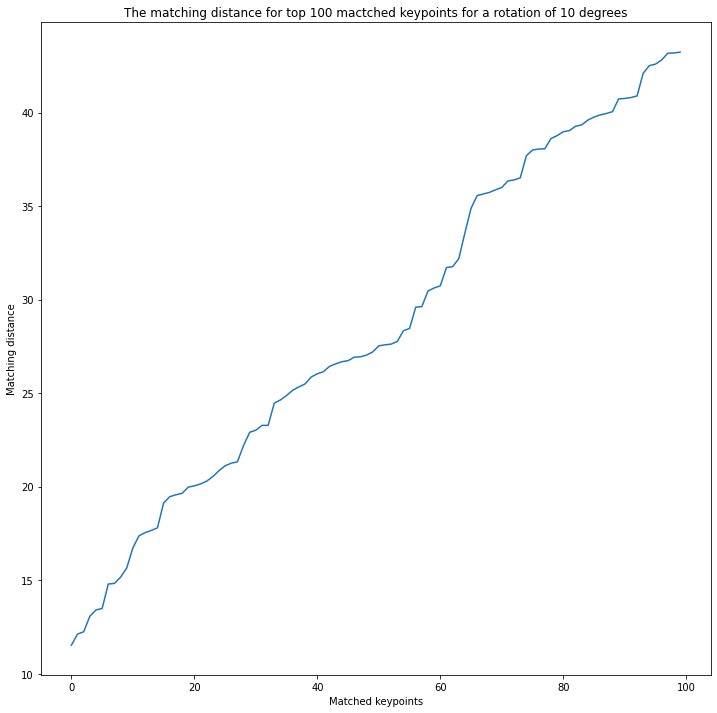

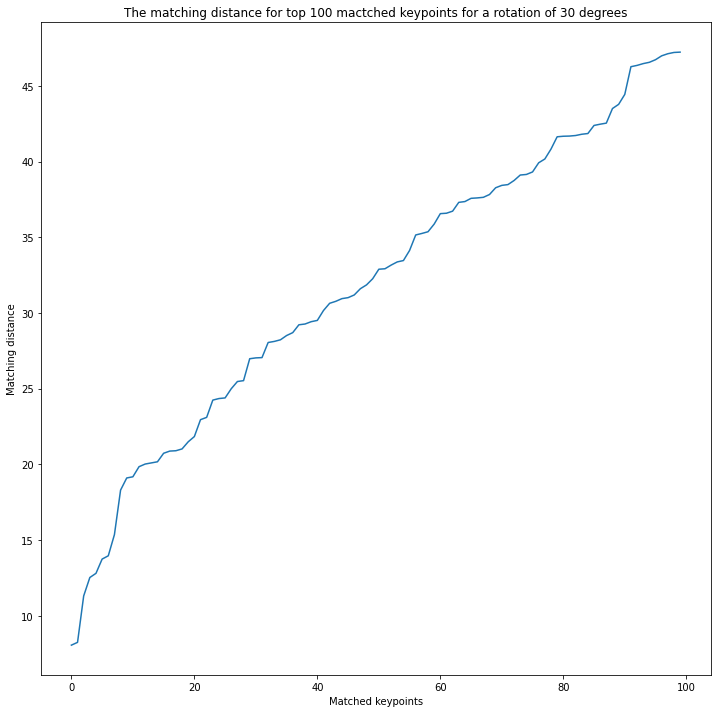

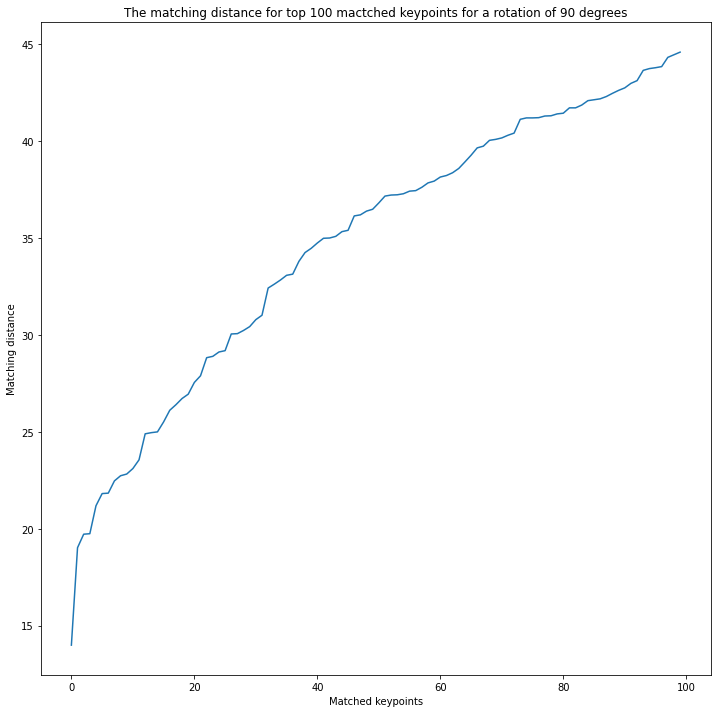

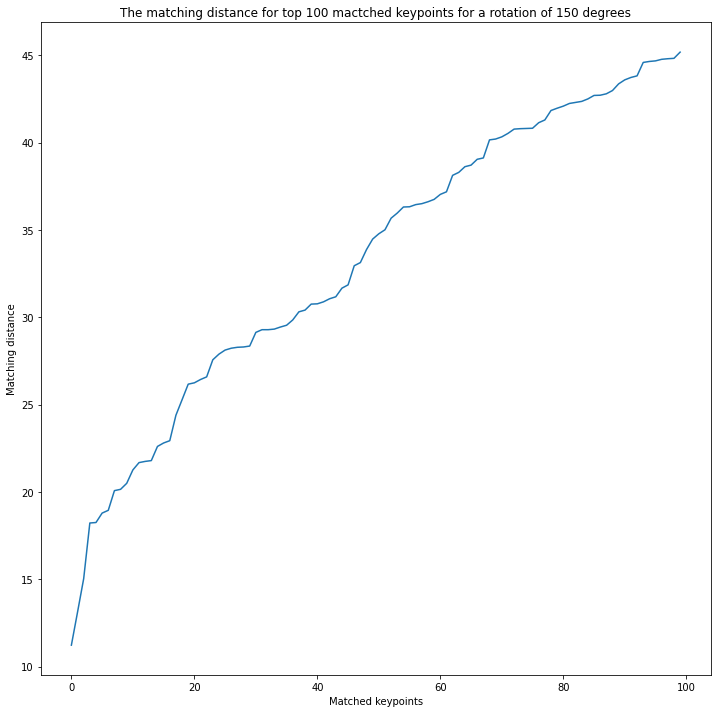

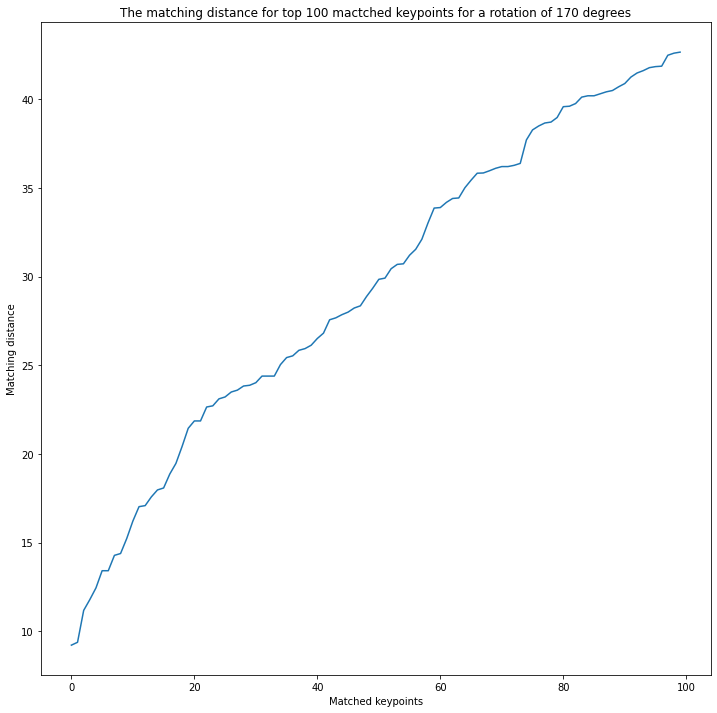

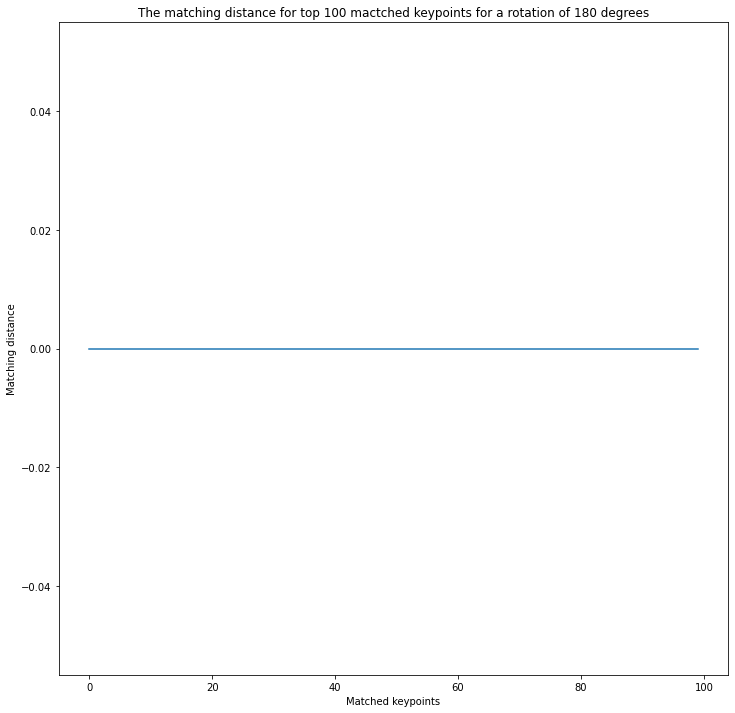

In [13]:
# Set the range of the keypoints on the x axis to be 100 
keypoints_range = np.arange(100)

#Define array for matching distance on the y axis
# matching the distances to the top keypoints and plotting for each scaled image
for x in range(6):
  matching_distance = []
  for n, m in enumerate(matchesrotated[x]):
      matching_distance.append(m.distance)
  plt.figure(figsize=(12,12))
  plt.plot(keypoints_range, matching_distance[:100])
  plt.title("The matching distance for top 100 mactched keypoints for a rotation of "+str(Rotateangles[x])+" degrees")
  plt.xlabel("Matched keypoints")
  plt.ylabel("Matching distance")
plt.show()

1.2.8 Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Reason the cause.

*From the trend in the plotted results we can see that the chage in rotation from 10 to 170 degrees leads to a similar matching distance, with 10 and 170 degrees being slightly smaller. However at a rotation of 180 degrees the matching distance is zero. This makes sense because at 10 and 170 degrees the rotated images are more similar to the orginal or a mirror of the orignal then at lets say 90 degrees where it is hardest to detect for swift features. At 180 degrees the image is just a mirror of the original image making the easist point to detect for swift features and thuss why the matching distance is zero.*

# 2. Matching using SIFT - Book Reveal
## 2.1. Find SIFT keypoints in given input images.

In [14]:
# load the images
book_crop = cv2.imread(path+"images/book_crop.jpg")
book_occlusion = cv2.imread(path+"images/book_occlusion.jpg")

# copy the images
book_crop_disp = book_crop.copy()
book_occlusion_disp = book_occlusion.copy()

# convert from BGR to RGB
book_crop = cv2.cvtColor(book_crop, cv2.COLOR_BGR2RGB)
book_occlusion = cv2.cvtColor(book_occlusion, cv2.COLOR_BGR2RGB)
book_crop_disp = cv2.cvtColor(book_crop_disp, cv2.COLOR_BGR2RGB)
book_occlusion_disp = cv2.cvtColor(book_occlusion_disp, cv2.COLOR_BGR2RGB)

# create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# detect SIFT features, with no masks
# detect (image, mask), mask is used when you want to detect features from a specific part of image
keypoints_crop = sift.detect(book_crop, None)
keypoints_occlusion = sift.detect(book_occlusion, None)

# draw the keypoints
cv2.drawKeypoints(book_crop, keypoints_crop, book_crop_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(book_occlusion, keypoints_occlusion, book_occlusion_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# printing number of SIFT keypoints
print('Number of keypoints for cropped image '+ str(len(keypoints_crop)))
print('Number of keypoints for occlusion image : '+ str(len(keypoints_occlusion)))

Number of keypoints for cropped image 947
Number of keypoints for occlusion image : 769


2.2. Match keypoints of reference image to the keypoints of the occluded image using brute-force method.

2.3. Sort matching keypoints according to the matching distance.

2.4. Display top ten matching keypoints. 


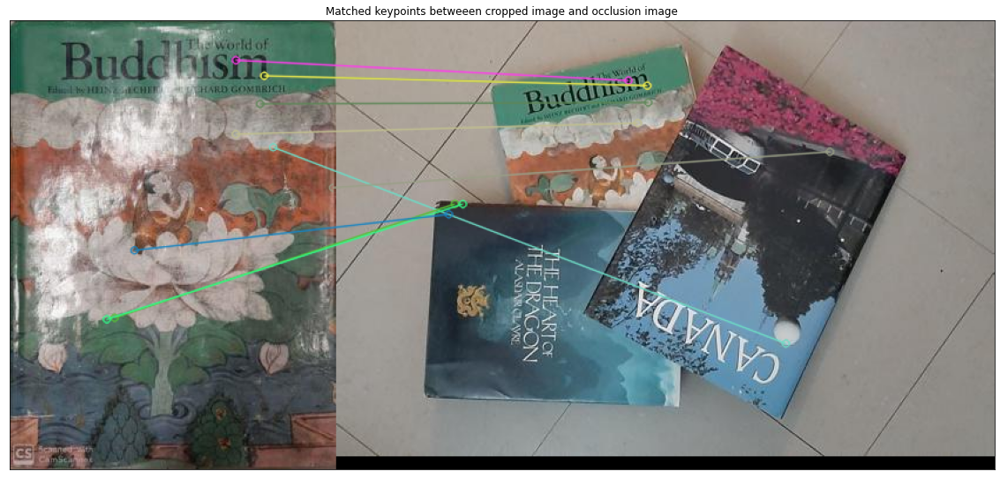

In [15]:

# Compute the descriptors of rotated images
keypoints_crop,descriptors_crop = sift.detectAndCompute(book_crop,None)
keypoints_occlusion,descriptors_occlusion = sift.detectAndCompute(book_occlusion,None)

# create BFMatcher object
bf = cv2.BFMatcher()#cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(descriptors_crop,descriptors_occlusion) 

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches and plot the images
matchedbook = cv2.drawMatches(book_crop,keypoints_crop,book_occlusion,keypoints_occlusion, matches[:10], None, flags=2)
plt.figure(figsize=(20,20))
plt.imshow(matchedbook)
plt.title("Matched keypoints betweeen cropped image and occlusion image"), plt.xticks([]), plt.yticks([])
plt.show()

2.5.  Compute a homography to align the images using RANSAC method and apply the transformation on the reference image

2.6. Paste transformed reference image on the occluded view to generate un-occluded view as shown in Figure 2(c).

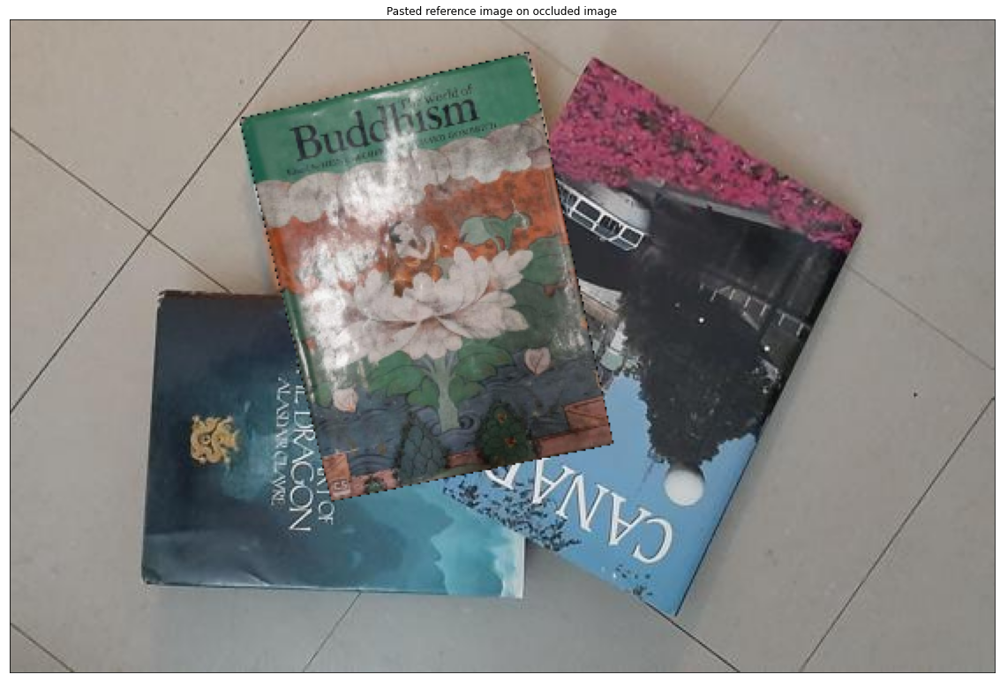

In [16]:
# copy the image
book_occlusion_disp = book_occlusion.copy()

#images size
height_crop, width_crop = book_crop.shape[0:2]
height_occlusion, width_occlusion = book_occlusion.shape[0:2]

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 320:
        GoodMatches.append((m.trainIdx, m.queryIdx))

mp_crop = np.float32([keypoints_crop[i].pt for (__, i) in GoodMatches])
mp_occlusion = np.float32([keypoints_occlusion[i].pt for (i, __) in GoodMatches])

# find homography and wrap image accordingly
H, __ = cv2.findHomography(mp_crop, mp_occlusion, cv2.RANSAC, 4)

wimg = cv2.warpPerspective(book_crop, H, (width_occlusion+width_crop,height_occlusion))
x, y = wimg.shape[0:2]

#pasting transformed image to generate Figure 2(c)
for x in range(wimg.shape[0]):
  for y in range(wimg.shape[1]):
    if(wimg[x][y].any()!=0):
      book_occlusion_disp[x][y] = wimg[x][y]

#plot the image
plt.figure(figsize=(20,20))
plt.imshow(book_occlusion_disp)
plt.title("Pasted reference image on occluded image"), plt.xticks([]), plt.yticks([])
plt.show()

# 3. Face Detection
## 3.1 Eigenface Representation

In [17]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from numpy import linalg as LA
from time import time
import os
import random

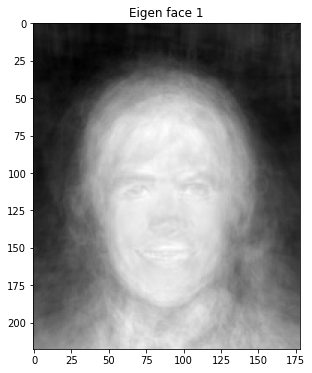

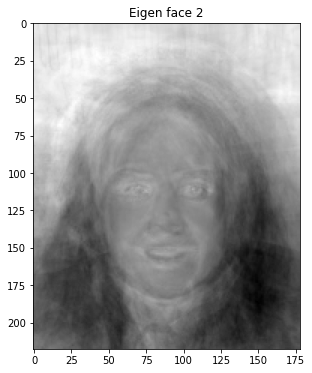

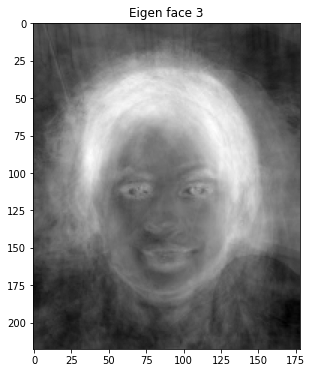

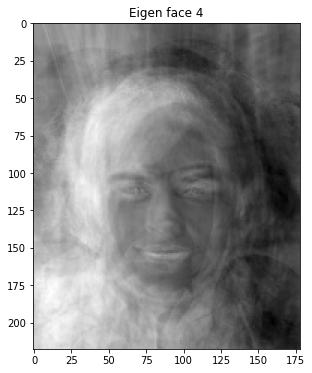

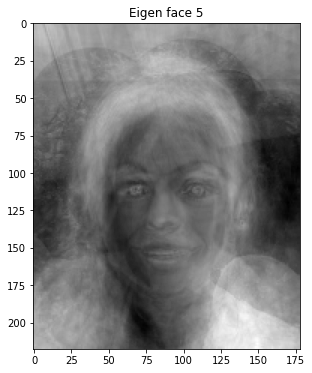

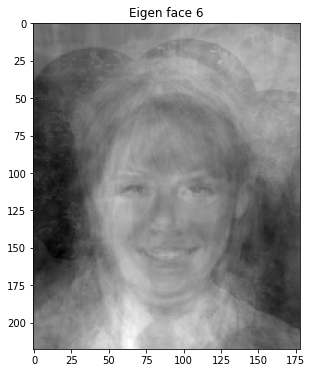

In [22]:
#Step 1 : obtain face images (images must be the same size)
# first creating an array for the celebrity image subset and arrays for calculations
# load the images
#take 100 images for the training dataset, I only imported 130 images so switch that to 1000, then conver the images to grayscale then crop
files = os.listdir(path + "images/celebA_subset/")
my_files = []
for i in random.sample(range(0, 130), 100):
  my_files.append(files[i])

# Step 2: converting images into an array
img_vector = []
img_vector = np.zeros(shape=(100, 38804))
for i in range(100):
  img = cv2.imread(path+"images/celebA_subset/" + files[i])
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_vector[i] = gray.ravel()

#Step 3: computing the average face vector
avg_face = (img_vector.mean(axis = 0))

# #Step 4: subtract the average face 
for i in range(100):
  img_vector[i] = img_vector[i] - avg_face

#Step 5: compute covariance matrix
d = np.transpose(img_vector)
c = np.matmul(img_vector, d)

#Step 6: compute the eigen vectors
eigVal, eigVec = np.linalg.eig(c)

v = np.matmul(d, eigVec)

topLocations = sorted(range(len(eigVal)), key=lambda i: abs(eigVal[i]), reverse=True)

#Plot the first 6 eigen faces
for i in range(6):
  curFace = np.reshape(v[:, i], (218, 178))
  plt.figure(figsize=(6, 6))
  plt.title("Eigen face " + str(i+1))
  plt.imshow(curFace, cmap="gray")

## 3.2 Face Detection

### Sliding Window

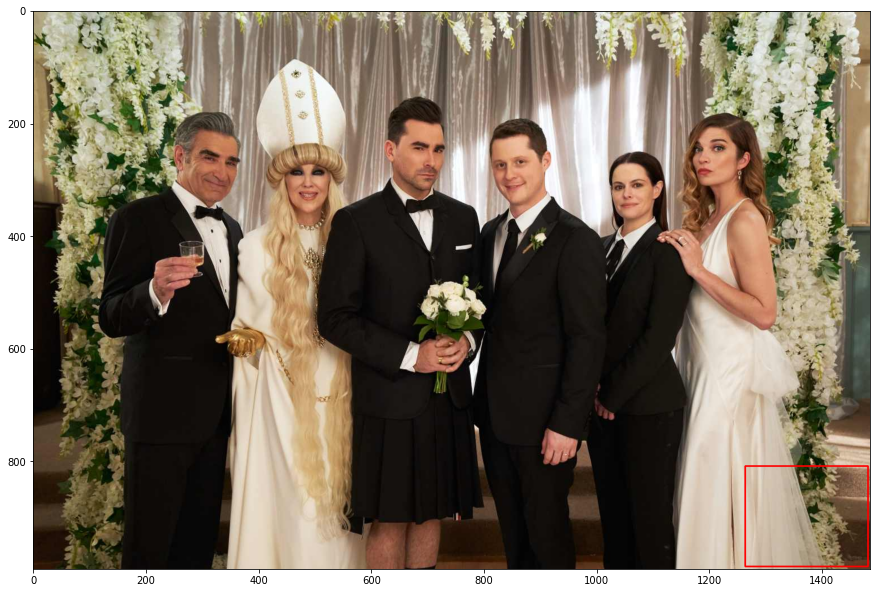

In [20]:
#load the image
image = cv2.imread(path+'images/schitts_creek_group_photo.jpeg')
Schittscreek_gray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#define the step size, height, width and drawing the rectangle
Schittscreek_tmp = Schittscreek_gray 
stepSize = 8
(width, height) = (218, 178)
for x in range(0, Schittscreek_gray.shape[1] - width , stepSize):
   for y in range(0, Schittscreek_gray.shape[0] - height, stepSize):
      window = Schittscreek_gray[x:x + width, y:y + height]

#draw the rectangle on the image and polt the image
cv2.rectangle(Schittscreek_tmp, (x, y), (x + width, y + height), (255, 0, 0), 2)
plt.figure(figsize=(15,15))
plt.imshow(np.array(Schittscreek_tmp).astype('uint8'), cmap="gray")
plt.show()

How well does the method work? How many false positive face detections do you get?

*The method does not work there is only one rectangle drawn on the corner of the image*

### Viola-Jones

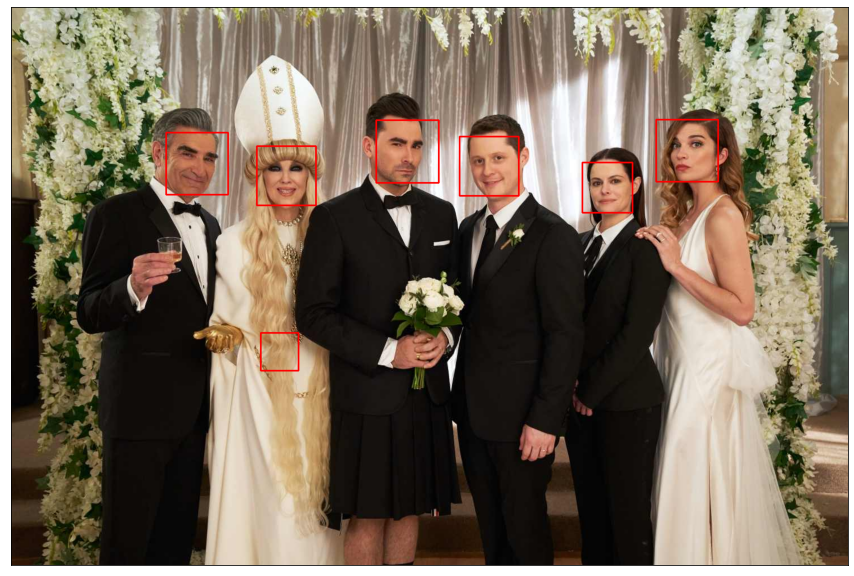

In [21]:
face_cascade = cv2.CascadeClassifier(path+'images/haarcascade_frontalface_default.xml')

Schittscreek = cv2.imread(path+'images/schitts_creek_group_photo.jpeg')
Schittscreek_gray = cv2.cvtColor(Schittscreek, cv2.COLOR_BGR2RGB)

faces = face_cascade.detectMultiScale(Schittscreek_gray, 1.1, 8)

for (x,y,w,h) in faces:
    Schittscreek_gray = cv2.rectangle(Schittscreek_gray,(x,y),(x+w,y+h),(255,0,0),2)

#plot the image
plt.figure(figsize=(15,15))
plt.imshow(Schittscreek_gray)
plt.xticks(())
plt.yticks(())
plt.show()

Viola-Jones flase positives = 1

Under what conditions would you expect the Viola-Jones detector to work when PCA does not?
*PCA is easy to detect faces and implement but at varying light intensity Scale and orientation the acuracy decreases. Viola-Jones has fast detection and less data needed as well as no rescaling of images needed however training time is slow also mostly effective when faces are in ful frontal view and good lighting conditions. When comparing the 2 Viola-Jones would be expected to work when PCA does not when the faces being detected are not the same as the training set being used.*